# UNet Prediction Visualization

Two types of visualizations for a single sample:

1. **Difference map** — color-coded comparison between UNet prediction and ground-truth label
   - Green: True Positive (TP)
   - Red: False Positive (FP)
   - Yellow: False Negative (FN)

2. **Overlay** — UNet prediction overlaid on the green channel of the original image

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path

print("Imports OK")

Imports OK


## 1. Configuration

In [2]:
DATA_DIR   = Path("../data")
OUTPUT_DIR = Path("../output/unet")
VIZ_DIR    = OUTPUT_DIR / "viz"
VIZ_DIR.mkdir(parents=True, exist_ok=True)

SAMPLE_ID      = "S1585-2_a"
PRED_THRESHOLD = 127   # predictions saved as 0/255 PNG

print(f"Sample     : {SAMPLE_ID}")
print(f"Data dir   : {DATA_DIR.resolve()}")
print(f"Output dir : {OUTPUT_DIR.resolve()}")

Sample     : S1585-2_a
Data dir   : /home/pony/projects/ienf_q/data
Output dir : /home/pony/projects/ienf_q/output/unet


## 2. Load Data

In [3]:
sample_dir = DATA_DIR / SAMPLE_ID
pred_path  = OUTPUT_DIR / f"{SAMPLE_ID}_pred.png"

bgr   = cv2.imread(str(sample_dir / "image.png"))
green = bgr[:, :, 1]   # BGR index 1 = green channel (strongest nerve signal)

label_raw = cv2.imread(str(sample_dir / "label.png"), cv2.IMREAD_GRAYSCALE)
pred_raw  = cv2.imread(str(pred_path),                cv2.IMREAD_GRAYSCALE)

label = label_raw > 127
pred  = pred_raw  > PRED_THRESHOLD

print(f"Image shape : {green.shape}")
print(f"Label FG px : {label.sum():,}")
print(f"Pred  FG px : {pred.sum():,}")

Image shape : (2867, 5632)
Label FG px : 30,053
Pred  FG px : 51,520


## 3. Metrics

In [4]:
tp = int((pred  &  label).sum())
fp = int((pred  & ~label).sum())
fn = int((~pred &  label).sum())
tn = int((~pred & ~label).sum())

dice      = 2 * tp / max(2 * tp + fp + fn, 1)
precision = tp / max(tp + fp, 1)
recall    = tp / max(tp + fn, 1)
iou       = tp / max(tp + fp + fn, 1)

print(f"TP: {tp:,}   FP: {fp:,}   FN: {fn:,}   TN: {tn:,}")
print(f"Dice      : {dice:.4f}")
print(f"Precision : {precision:.4f}")
print(f"Recall    : {recall:.4f}")
print(f"IoU       : {iou:.4f}")

TP: 23,307   FP: 28,213   FN: 6,746   TN: 16,088,678
Dice      : 0.5714
Precision : 0.4524
Recall    : 0.7755
IoU       : 0.4000


## 4. Difference Map

| Color | Meaning |
|---|---|
| Green | True Positive — correctly detected fiber |
| Red | False Positive — predicted fiber not in GT |
| Yellow | False Negative — GT fiber missed by model |
| Dark gray | True Negative — background |

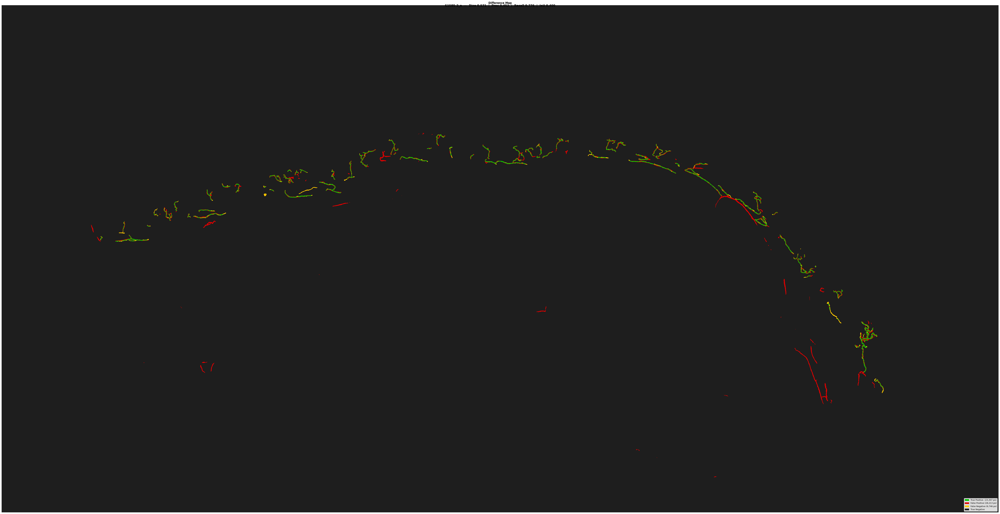

Saved: ../output/unet/viz/S1585-2_a_diff_map.png


In [5]:
COLOR_TP = np.array([  0, 200,   0], dtype=np.uint8)   # green
COLOR_FP = np.array([220,   0,   0], dtype=np.uint8)   # red
COLOR_FN = np.array([255, 200,   0], dtype=np.uint8)   # yellow
COLOR_TN = np.array([ 30,  30,  30], dtype=np.uint8)   # dark gray

h, w = label.shape
diff_map = np.empty((h, w, 3), dtype=np.uint8)
diff_map[ label &  pred] = COLOR_TP
diff_map[~label &  pred] = COLOR_FP
diff_map[ label & ~pred] = COLOR_FN
diff_map[~label & ~pred] = COLOR_TN

legend_patches = [
    mpatches.Patch(color=COLOR_TP / 255, label=f"True Positive  ({tp:,} px)"),
    mpatches.Patch(color=COLOR_FP / 255, label=f"False Positive ({fp:,} px)"),
    mpatches.Patch(color=COLOR_FN / 255, label=f"False Negative ({fn:,} px)"),
    mpatches.Patch(color=COLOR_TN / 255, label="True Negative"),
]

fig, axes = plt.subplots(1, 1, figsize=(64,32))

# axes[0].imshow(label,    cmap="gray", interpolation="nearest")
# axes[0].set_title("Ground Truth Label", fontsize=12, fontweight="bold")

# axes[1].imshow(pred,     cmap="gray", interpolation="nearest")
# axes[1].set_title("UNet Prediction",   fontsize=12, fontweight="bold")

axes.imshow(diff_map,               interpolation="nearest")
axes.set_title("Difference Map",    fontsize=12, fontweight="bold")
axes.legend(handles=legend_patches, loc="lower right", fontsize=9, framealpha=0.85)
axes.axis("off")
# for ax in axes:
#     ax.set_xticks([])
#     ax.set_yticks([])

fig.suptitle(
    f"{SAMPLE_ID}  —  Dice {dice:.3f}  |  Prec {precision:.3f}  |  Recall {recall:.3f}  |  IoU {iou:.3f}",
    fontsize=13, fontweight="bold"
)
plt.tight_layout()
out_path = VIZ_DIR / f"{SAMPLE_ID}_diff_map.png"
plt.savefig(out_path, dpi=120, bbox_inches="tight")
plt.show()
print(f"Saved: {out_path}")

## 5. Prediction Overlay on Green Channel

UNet prediction blended over the original green channel as a semi-transparent red mask.

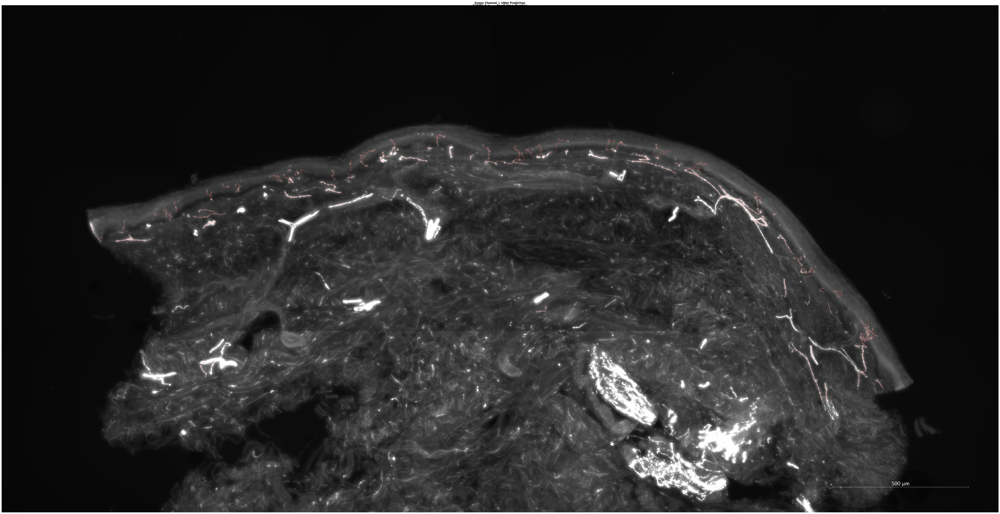

Saved: ../output/unet/viz/S1585-2_a_overlay.png


In [6]:
OVERLAY_COLOR = (255, 80, 80)   # RGB
OVERLAY_ALPHA = 0.2

base    = np.stack([green, green, green], axis=-1).astype(np.float32)
blended = base.copy()
blended[pred] = (1 - OVERLAY_ALPHA) * base[pred] + OVERLAY_ALPHA * np.array(OVERLAY_COLOR)
overlay_img = np.clip(blended, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 1, figsize=(64, 32))

# axes[0].imshow(green,       cmap="gray", interpolation="nearest")
# axes[0].set_title("Green Channel (original)",            fontsize=12, fontweight="bold")
axes.axis("off")
axes.imshow(overlay_img,              interpolation="nearest")
axes.set_title("Green Channel + UNet Prediction",     fontsize=12, fontweight="bold")

pred_patch = mpatches.Patch(
    color=(OVERLAY_COLOR[0]/255, OVERLAY_COLOR[1]/255, OVERLAY_COLOR[2]/255),
    label=f"Predicted fiber  (Dice {dice:.3f})"
)
# axes[1].legend(handles=[pred_patch], loc="lower right", fontsize=9, framealpha=0.85)

# for ax in axes:
#     ax.set_xticks([])
    # ax.set_yticks([])

fig.suptitle(f"{SAMPLE_ID}  —  Prediction Overlay", fontsize=13, fontweight="bold")
plt.tight_layout()
out_path = VIZ_DIR / f"{SAMPLE_ID}_overlay.png"
plt.savefig(out_path, dpi=120, bbox_inches="tight")
plt.show()
print(f"Saved: {out_path}")